<center> <h1>
    Project 01:  Collisions in Low Earth Orbit: </h1><h2> A Simulation of Potential Collisions between Hubble Space Telescope Instruments and Space Debris: </h2> 
<h4>PHYS 210: Introduction to Computational Physics</h4>
<h4>Ayan Araleh</h4>
<h4>October 28th, 2024</h4>
<h4>Edited: December 19th, 2024</h4>
 </center>



<center> <h3> <b> Introduction and Background Information </b> </h3> </center>

This study aims to investigate the influence of different collision parameters on the material stress, strain, and deformation of one of Hubble Space Telescope's four fine guidance sensors. Specifically, the primary variables of focus are: the relative velocity between the two objects, the mass of the debris, and the size of the debris. These three variables majorly determine the magnitude of an object's impact force for a collision. The ranges used to test different collision scenarios will be motivated based on public cataloged data for common size, orbital velocity, and mass of space debris. By comparing the stress caused by the debris to the yield and tensile stress of the sensor for each variable, each model can be analyzed to see the effects of each impact. Since the average debris is small relative to Hubble, it's more likely to collide and significantly damage smaller components. This study examines the impact of debris collisions on HST’s Fine Guidance Sensor (FGS) by analyzing stress, strain, and deformation to assess its vulnerability and to emphasize the need for debris mitigation. Hubble is one of the most pivotal astronomical inventions that is in Low Earth Orbit (LEO) (altitudes less than 2000 km). As of 2024, there are approximately 35,000 objects in LEO, with an estimated 25,000 pieces of trackable space debris (ESA, 2024). Only objects greater than 10 cm can be accurately tracked, the rest are estimated using simulations and radar detection systems. In the 34 years following Hubble's launch, space debris in LEO has increased at exponentially large rates due to increasing launches into orbit. LEO is a finite amount of space, and with the current pace of satellite launches and debris accumulation, we could approach a saturation point. As the density of objects increases, the risk of collisions grows, which in turn could accelerate the generation of more debris, potentially reaching a threshold where space activities in LEO become unsustainable.  

According to the European Space Agency (ESA), the approximate categorized space debris in Low Earth Orbit (LEO) (altitudes less than 2000 km) as of 2024 is as follows (ESA, 2024):
- 670,000 of those are 1cm to 10cm in size. 
- 170 million of those are 1 mm to 1 cm in size.
- 25,000 of those are larger than 10 cm. 
- Average orbital speed of these objects is around 7km/s to 10km/s
  
Researchers under the Italian National Research council estimated that between 2019 and 2020 alone, the amount of satellites launched annually in LEO increased by 150%, from 385 per year to over 1000 per year (Pardini & Anselmo, 2021). ESA also predicted the annual debris collision probability in 2020 for HST is 0.3%, which doubled from 0.15% in the early 2000s (ESA, 2020). The overall consensus following each annual report is that debris in LEO continues to increase exponentially as a function of the number of satellite launches per year increases. This increase is also proportional to space collision probability, which relates to the phenomenon called Kessler's Syndrome. Kessler's Syndrome stems from research models developed by NASA researcher Donald Kessler in 1978, who developed equations for debris distribution in space to predict collision probability over time. The research hypothesized that by the 2000s, debris density in LEO will become incredibly dense to a point where space collisions will become a self-sustaining process as each collision generates more debris, leading to more collisions. Space agencies across the globe are actively working on mitigation efforts to minimize current debris accumulation, such as developing international guidelines for end-of-life disposal, using tools such as robotic arms, nets, and harpoons to collect debris, developing more refined tracking systems to aid in collision avoidance, and many more that are actively being created. 
 
<center> <h3> <b>Definitions and Assumptions:</b> </h3> </center>

**Abbreviations**:
1. Hubble Space Telescope => HST
2. Fine Guidance Sensor => FGS
3. Low Earth Orbit => LEO
4. European Space Agency => ESA

**Assumptions**:
1. FGS material is Aluminum Alloy 2024.
2. Yield and tensile strength of debris will not be accounted/investigated. 
3. Debris is a solid sphere.
4. FGS is solid and cubic.
5. Collision occurs at same altitude.
6. Objects are orbiting in opposite directions.
7. Relative speed is between HST and debris, sensor velocity is zero.
8. Collision times occur instantaneously.
9. Collisions are partially elastic, coefficient of restitutions for each collision will range between 0.1-0.8.

**Definitions**:
1. Debris stress is defined as impact force per debris area (stress).
2. Models will track when debris stress exceeds yield stress of FGS material.
3. Damage is defined when debris stress reaches or exceeds yield stress of FGS material.


<center> <h3> <b>Definite Collision Time Justification</b> </h3> </center>

In this model, collisions are treated as discrete events occurring over a fixed duration of $10^{-3}$ seconds rather than being fully time-stepped. This approach aligns with the impulse approximation used in classical mechanics, which models rapid force applications over short, finite periods to simplify the treatment of impact forces. Realistically, a collision would occur over an infinitesimally small time interval, which would require impractically small time steps to simulate accurately. By defining a small, fixed time interval for each collision, we achieve a balance between computational efficiency and physical accuracy.

Using a fixed interval enables us to vary parameters such as velocity, mass, and the coefficient of restitution across multiple iterations without requiring the computational overhead of ultra-fine time-stepping. This approach has been validated in studies comparing single-step and time-stepped simulations, where discrete-event approximations showed justified agreement with time-stepped methods in terms of impact force results. For example, a study by Witkowski, Kudra, and Awrejcewicz (2021) from Lodz University of Technology compared the results of single-event and time-stepped models in simulating impact forces as functions of velocity and coefficients of restitution. They found that both methods aligned well with experimental data, supporting the use of discrete time intervals for collisions.

Therefore, using a fixed interval of $10^{-3}$ seconds in this model allows for computationally efficient and physically accurate simulations without the need for exhaustive time-stepping, maintaining the fidelity of the simulation while allowing for varied experimental conditions. 


<center> <h3> <b> Formulae and Constants </b> </h3> </center>

1. **Collision Time**:
   $$
   \Delta t = 10^{-3} s$$
   This is our maximum time interval $t_{\text{max}}$. The max interval will be $10^{-3} s$. This is small enough to produce large impact force magnitudes and gives a fixed time for all collisions so that other variables can be compared. 

2. **Impact Area Calculation**:
   $$
   A_{\text{impact}} = \pi \left(\frac{d_{\text{debris}}}{2}\right)^2
   $$
   This calculates the impact area assuming the debris is spherical, where $d_{\text{debris}}$ is the diameter of the debris.


3. **Relative Velocity & New**:
   $$
   v_{\text{relative}} = v_{\text{hubble}} - v_{\text{debris}}
   $$

   $$
   \Delta v_{\text{relative}} = m_{\text{sensor}} * \frac{v_{\text{hubble}} - v_{\text{debris}} * (1 + e)}{m_{\text{sensor}} + m_{\text{debris}}}
   $$
   This is the relative velocity of the collision. Since we are taking the sensor's velocity to be zero during the collision, each force/momentum calculation will consider the debris velocity to be the relative velocity between HST and the debris. The change in relative velocity for a partially elastic collision will account for the collision with the sensor, while also considering the sensor will remain stationary relative to the debris throughout the collision. The formula is derived using Conservation of Momentum.

4. **Impact Force Calculation**:
   $$
   F_{\text{impact}} = m_{\text{debris}} * \frac{\Delta v_{\text{relative}}}{dt}
   $$
   This calculates the force exerted on the sensor based on the mass of the debris $m_{\text{debris}}$, the relative velocity change, and the collision time.

5. **Stress Calculation**:
   $$
   \sigma_{\text{sensor}} = \frac{F_{\text{sensor}}}{A_{\text{impact}}}
   $$
   This calculates the stress on the sensor by dividing the force $F_{\text{sensor}}$ by the impact area $A_{\text{impact}}$.

6. **Accumulated Strain and Deformation Calculations**:
    $$ \epsilon = \frac{\sigma_{\text{sensor}} - \sigma_{\text{yield}}}{E_{aluminum}}$$

   Subtracting the yield strength $\sigma_{\text{yield}}$ from the calculated stress $\sigma_{\text{sensor}}$ ensures that only the excess stress contributes to plastic strain (since any stress below the yield strength would cause elastic, recoverable deformation).

   $$ Deformation = \epsilon * N_{collisions} $$

   This is used to track total deformation over multiple impacts. The variable $N_{collisions}$ represents the number of collisions or impact repetitions. This approach will help model cumulative plastic deformation, which is typical in materials subjected to repeated loading.

### Material Property Values for Aluminum 2024

- **Yield Strength** $\sigma_y $
  $$
  \sigma_y = 324 \, \text{MPa}
  $$

- **Tensile Strength** $\sigma_t $
  $$
  \sigma_t = 469 \, \text{MPa}
  $$

- **Young's Modulus** $ E $
  $$
  E = 73.1 \, \text{GPa}
  $$


## Model 1: Varying debris velocity

In this model, different debris velocity values will be tested to visualize the influence that different velocity magnitudes have on the relative velocity for the collision. The mass and area of the debris will remain fixed, based on the example debris currently orbiting at approximately the same altitude as HST.  

For each COR, it is seen in the model that increasing the magnitude has a proportional effect on the force of impact of the collision. The yellow bar indicates the max yield force needed to damage the sensor. Qualitatively, each value surpasses this max force by large magnitudes. Therefore, it can be said that despite the small impact area and mass of debris compared to the sensor, the orbital relative collision speed still guarantees damage to the sensor.

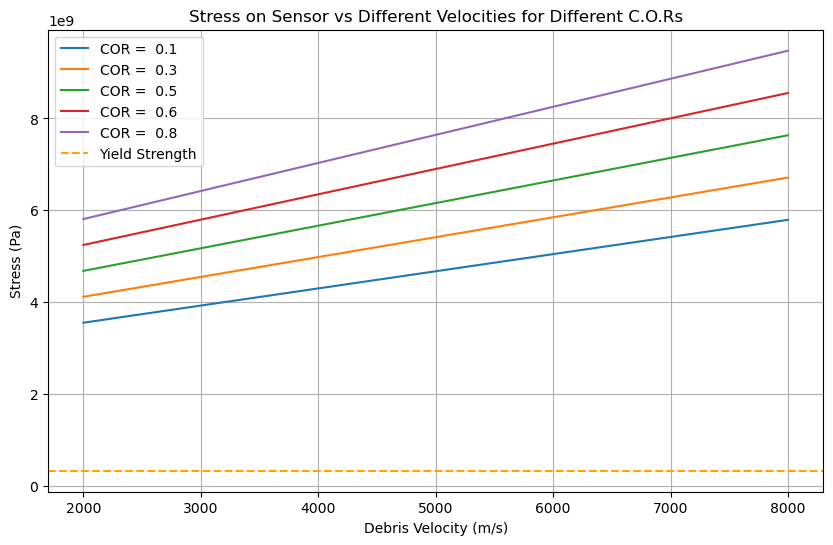

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
# Material and environmental constants
E_sensor = 7.31e10  # Young's modulus of Aluminum 2024 (Pa)
yield_sensor = 324e6  # Yield strength of Aluminum 2024 (Pa), limit for permanent deformation
impact_area = 7.854e-3  # Impact area assuming a spherical debris with diameter of 0.1 m (m^2)
collision_time = 1e-3  # Time interval for calculating the impact force (s)

# Initial velocities and masses
v_hubble = -7500  # Velocity of the Hubble telescope (sensor) in m/s, opposite to debris
m_debris = 2.7  # Mass of the debris in kg
m_sensor = 220  # Mass of the sensor in kg

# Coefficients of restitution for varying elasticity in the collision
cor_values = np.linspace(0.1, 0.8, 5)  # Range of COR values from 0.1 to 0.8 in 5 steps

# Setting up the plot for stress vs. debris velocity for each COR value
plt.figure(figsize=(10, 6))

# Loop through each coefficient of restitution to calculate and plot stress
for e in cor_values:
    stress_data = []  # List to store stress values for the current COR
    velocities = np.linspace(2000, 8000, 5)  # Range of debris velocities from 2000 m/s to 8000 m/s
    v_relatives = []  # List to store relative velocities for each impact (for verification or further use)
    
    # Loop through each debris velocity to calculate the corresponding stress on the sensor
    for v_debris in velocities:
        # Calculate relative velocity after impact considering the COR, using conservation of momentum
        delta_vr = (m_sensor * (v_debris - v_hubble) * (1 + e)) / (m_sensor + m_debris)
        
        # Calculate the force using the momentum transfer rate (force = change in momentum / time)
        force = m_debris * delta_vr / collision_time  # Using dt = 1e-2 to estimate the force
        
        # Calculate stress on the sensor (stress = force / impact area)
        stress = force / impact_area
        stress_data.append(stress)  # Append the calculated stress to the list for plotting
    
    # Plot stress vs debris velocity for the current COR value
    plt.plot(velocities, stress_data, label=f'COR = {e: .1f}')

# Add a horizontal line for yield strength of the sensor material, indicating its deformation limit
plt.axhline(y=yield_sensor, color='orange', linestyle='--', label='Yield Strength')

# Plot title, labels, and legend
plt.title('Stress on Sensor vs Different Velocities for Different C.O.Rs')
plt.xlabel('Debris Velocity (m/s)')
plt.ylabel('Stress (Pa)')
plt.legend()
plt.grid(True)

# Display the final plot
plt.show()

## Model 2: Varying Impact area and Mass of Debris:
In this model, we model different collisions at the same relative speed, but varying area and mass for the debris. This is done to compare the relationship between the two variables to see which has the greatest influence on the damage of the sensor. The colour bars are to the magnitude of $10^{10}$.

The 3d model shows that for each COR, the impact area vs the stress on the sensor remains relatively stagnant compared to the mass vs the stress. Visually, increasing the mass follows a drastic exponentially increasing trend on the sensors stress. 

In [2]:
##Function for plotting stress values of varying debris mass and size
def stress_value_plot(cor_values0):
    # Set the collision duration and initial velocities for Hubble and debris
    t_collision = 1e-3  # Collision duration in seconds
    v_hubble = -8000  # Velocity of the Hubble telescope (sensor) in m/s, moving in opposite direction
    v_debris = 8000  # Initial velocity of the debris in m/s

    # Define a range of debris masses and sizes for simulation
    debris_masses = np.linspace(0.5, 5, 10)  # Range of debris masses from 0.5 kg to 5 kg
    debris_sizes = np.linspace(0.01, 0.1, 10)  # Range of debris diameters from 0.01 m to 0.1 m
    debris_areas = np.pi * (debris_sizes / 2) ** 2  # Calculate impact area from diameter, assuming spherical debris (m^2)
    
    # Set up a subplot for each coefficient of restitution (COR) in cor_values0
    fig, axs = plt.subplots(1, len(cor_values0), figsize=(100, 80), subplot_kw={'projection': '3d'})
    
    # Loop over each COR value in cor_values0
    for e, cor in enumerate(cor_values0):
        # Initialize surface array to store stress values for the current COR
        stress_surface = np.zeros((len(debris_masses), len(debris_areas)))
        
        # Loop over each mass and area combination to calculate stress
        for x, m_deb in enumerate(debris_masses):
            for y, area_impact in enumerate(debris_areas):
                # Calculate relative velocity (delta_vr) after impact based on COR
                delta_vr = (m_sensor * (v_debris - v_hubble) * (1 + cor)) / (m_sensor + m_deb)
                
                # Calculate the force of impact from change in momentum
                force = (m_deb * delta_vr) / t_collision
                
                # Calculate the stress due to impact force
                stress = force / area_impact
                
                # Store the calculated stress value in the stress surface array
                stress_surface[x, y] = stress
            
        # Create a meshgrid for plotting surface of impact areas vs. masses
        X, Y = np.meshgrid(debris_areas, debris_masses)

        # Plot the stress surface for the current COR value
        surf = axs[e].plot_surface(X, Y, stress_surface, cmap='viridis')

        # Set title and labels for each 3D plot
        ft = 70  # Font size for axis labels
        ls = 60  # Font size for tick labels
        ts = 45  # Font size for color bar tick labels
    
        axs[e].set_title(f'3D Plot of Stress vs Area and Mass; COR = {cor: .1f}', fontsize=70)
        axs[e].set_xlabel('Impact Area (m^2)', fontsize=ft)
        axs[e].set_ylabel('Mass (kg)', fontsize=ft)
        axs[e].set_zlabel('Stress (Pa)', fontsize=ft)
        axs[e].xaxis._axinfo['label']['space_factor'] = 20
        axs[e].yaxis._axinfo['label']['space_factor'] = 20
        axs[e].zaxis._axinfo['label']['space_factor'] = 20
        
        # Set tick label sizes
        #axs[e].tick_params(axis='both', which='major', labelsize=ls)
        axs[e].tick_params(axis='x', which='major', labelsize=ls, rotation=45)
        axs[e].tick_params(axis='y', which='major', labelsize=ls, rotation=-45)
        axs[e].tick_params(axis='z', which='major', labelsize=ls)
        axs[e].set_xticks(np.linspace(debris_areas.min(), debris_areas.max(), 2))  # Only 3 tick labels on x-axis
        axs[e].set_yticks(np.linspace(debris_masses.min(), debris_masses.max(), 2))  # Only 3 tick labels on y-axis
        axs[e].set_zticks(np.linspace(stress_surface.min(), stress_surface.max(), 2))  # 4 tick labels on z-axis
        
        # Add a color bar for the current subplot, showing stress scale
        cbar = fig.colorbar(surf, ax=axs[e], shrink=0.7, aspect=5, pad=0.1)
        #cbar = fig.colorbar(surf, ax=axs[e], shrink=1, aspect=5)
        cbar.ax.tick_params(labelsize=ts)  # Set color bar tick label size

    # Adjust layout 
    plt.tight_layout()
    plt.show()

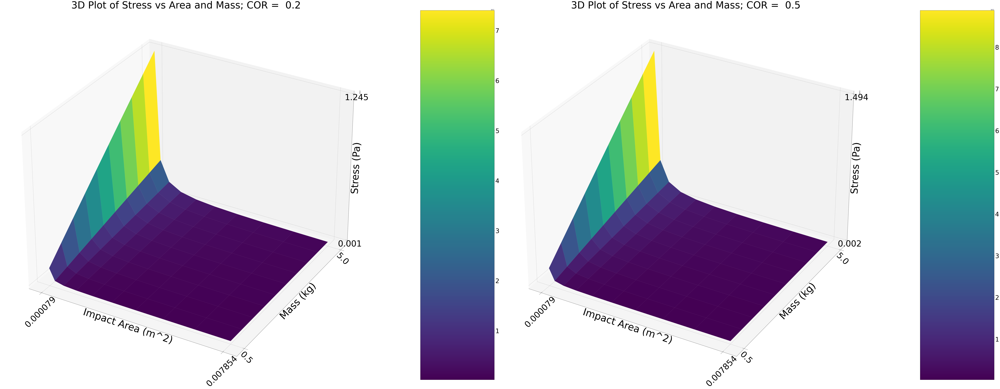

In [3]:
from mpl_toolkits.mplot3d import Axes3D

cor_values = [0.1, 0.25, 0.5, 0.75, 0.9]

# COR for various partially elastic collisions
stress_value_plot(cor_values[1:3])

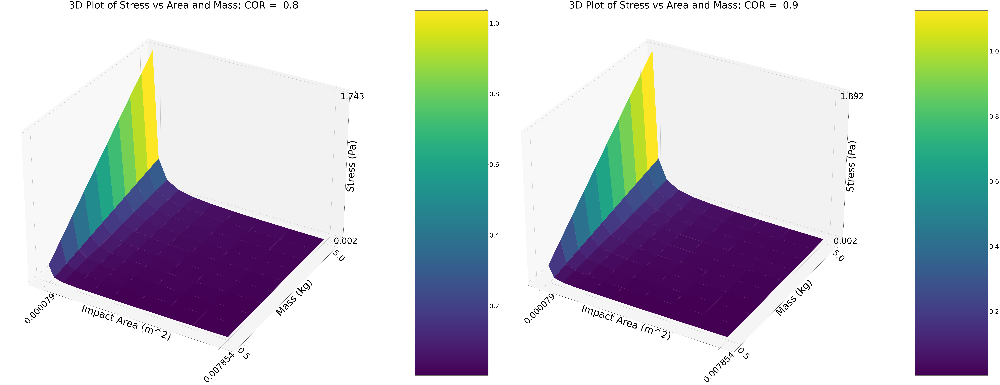

In [4]:
stress_value_plot(cor_values[3:5])

## Model 3: Further Investigations on Sensor Deformation Accumulation

Now that the previous models determined the main two factors that influence the magnitude of the collision the most, a more fruitful investigation as to how the sensor deforms after a number of collisions between debris of varying mass and velocities can be investigated. Since the biggest concern in conversations about space debris is the increase in probability of space collisions, the following models will visualize an negative future implications of increasing collisions on an important spacecraft component that largely contributes to its primary functionality.

Deformation is defined as a ratio between the change in shape of an object vs. its original shape. A deformation ratio of 1 indicates complete and irreversible deformation of the object. The first model varies only the velocity of the debris for multiple collisions, and shows that the collision would need to be close to perfectly elastic for complete deformation to occur, which may not be an incredibly probabilistic scenario.

The second model varies both the velocity and mass of the debris for multiple collisions. In this case, for different partially elastic COR values, the deformation ratio surpasses 1, indicating complete deformation. This shows that increasing both the velocity and mass of the debris along with increasing collision probabilities increases the likelyhood of permanently damaging the sensor. 

These resulting models do not show the other effects of increased collision probability. Since Hubble's overall surface area is much greater, it'd be more likely that increased collision probability would also affect and damage other key components of the ship. If these models were applied to other components of Hubble, it could show a more holistic picture of the negative impact of debris collisions for the entire spacecraft.

In [5]:
##Function for plotting stress values of varying velocities and number of collisions
## Sets area and mass to example debris parameters
def deformation_plots(cor_values0, collisions, area_impact=7.85e-3, debris_mass=2.7):
    # Constants for the material properties sensor
    E_sensor = 7.31e10  # Young's modulus of Aluminum 2024 (Pa)
    yield_sensor = 324e6  # Yield strength of Aluminum 2024 (Pa), threshold for permanent deformation

    # Collision timing and initial velocity setup
    t_collision = 1e-2  # Collision duration in seconds

    # Relative velocity settings for debris and sensor
    v_stop = 15000  # Approximate max relative velocity for debris collision in m/s
    v_start = v_stop / collisions  # Starting velocity assuming evenly distributed collisions
    velocities = np.linspace(v_start, v_stop, collisions)  # Array of velocities (m/s) over all collisions
    n_collisions = np.linspace(1, collisions + 1)  # Array for number of collisions

    # Set up subplots for each coefficient of restitution (COR) in cor_values0
    fig, axs = plt.subplots(1, len(cor_values0), figsize=(100, 80), subplot_kw={'projection': '3d'})
    
    # Loop over each COR value to calculate deformation for different scenarios
    for e, cor in enumerate(cor_values0):
        deformation_surface = np.zeros((len(n_collisions), len(velocities)))  # Initialize deformation data array
        
        # Loop through each collision count and velocity combination
        for x, n in enumerate(n_collisions):
            strain_accumulator = 0.  # Initialize strain accumulator for total deformation over collisions
            
            for y, v_collision in enumerate(velocities):
                # Calculate relative velocity after impact based on COR
                delta_vr = (m_sensor * v_collision * (1 + cor)) / (m_sensor + debris_mass)
                
                # Calculate force of impact using momentum transfer rate
                force_impact = (debris_mass * delta_vr) / t_collision
                
                # Calculate stress due to impact force over the area of impact
                stress_sensor = force_impact / area_impact
                
                # Calculate strain only if stress exceeds yield strength, indicating plastic deformation
                if stress_sensor >= yield_sensor:
                    strain_new = (stress_sensor - yield_sensor) / E_sensor  # Calculate strain due to plastic deformation
                    strain_accumulator += strain_new*n   # Accumulate total deformation over collisions
                
                # Store accumulated deformation in the surface array for plotting
                deformation_surface[x, y] = strain_accumulator
            
        # Create meshgrid for plotting deformation against velocity and collision count
        X, Y = np.meshgrid(velocities, n_collisions)

        # Plot the deformation surface for the current COR
        surf = axs[e].plot_surface(X, Y, deformation_surface, cmap='viridis')

        # Set titles and labels for each 3D plot
        ft = 70  # Font size for axis labels
        ls = 60  # Font size for tick labels
        ts = 60  # Font size for color bar tick labels
    
        axs[e].set_title(f'3D Plot of Deformation vs Velocity and Number of Collisions; COR = {cor: .1f}', fontsize=80)
        axs[e].set_xlabel('Velocities (m/s)', fontsize=ft)
        axs[e].set_ylabel('Number of Collisions', fontsize=ft)
        axs[e].set_zlabel('Deformation (Pa)', fontsize=ft)
        
        # Set tick label sizes 
        #axs[e].tick_params(axis='both', which='major', labelsize=ls)
        axs[e].tick_params(axis='x', which='major', labelsize=ls, rotation=45)
        axs[e].tick_params(axis='y', which='major', labelsize=ls, rotation=-45)
        axs[e].tick_params(axis='z', which='major', labelsize=ls)
        axs[e].set_xticks(np.linspace(velocities.min(), velocities.max(), 2))  # Only 2 tick labels on x-axis
        axs[e].set_yticks(np.linspace(n_collisions.min(), n_collisions.max(), 2))  # Only 2 tick labels on y-axis
        axs[e].set_zticks(np.linspace(deformation_surface.min(), deformation_surface.max(), 2))  # 2 tick labels on z-axis

        # Add color bar to each subplot, indicating deformation scale
        cbar = fig.colorbar(surf, ax=axs[e], shrink=1, aspect=5)
        cbar.ax.tick_params(labelsize=ts)  # Set font size for color bar ticks

    # Adjust layout 
    plt.tight_layout()
    plt.show()

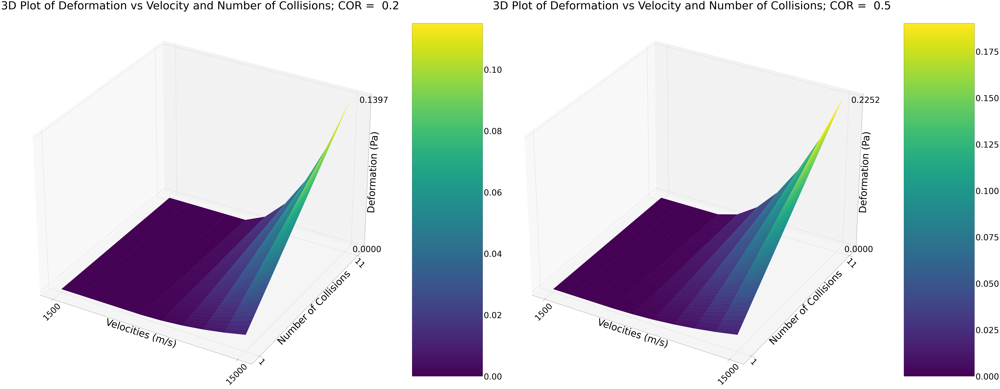

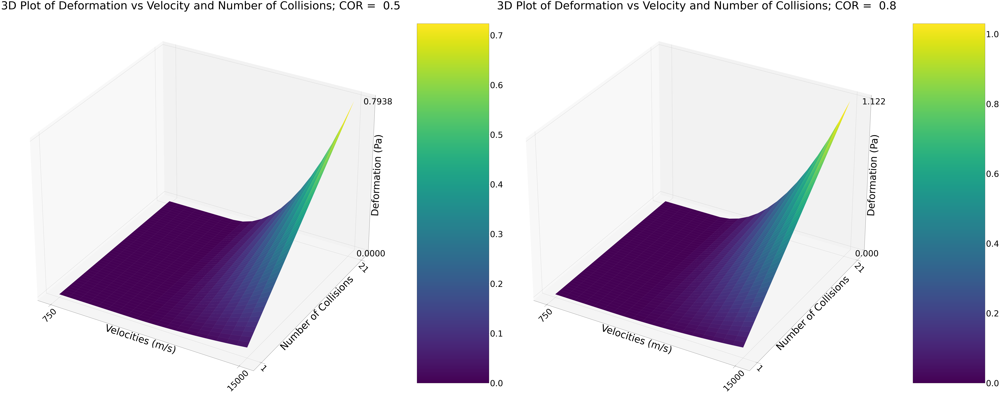

In [6]:
cor_values = [0.1, 0.25, 0.5, 0.75, 0.9]
# COR for various partially elastic collisions

deformation_plots(cor_values[1:3], 10)

deformation_plots(cor_values[2:4], 20)

## Concluding Remarks:
In summary, this investigation highlights the two primary factors that most significantly influence collision impact: debris mass and velocity. Through modeling, we gain insight into how repeated debris impacts can cause deformation in critical spacecraft components, such as sensors, over time. As the probability of space collisions continues to rise, these models emphasize the potential for cumulative, irreversible damage to essential mission systems.

The findings show that while high velocities alone may not typically result in complete deformation, the combination of increased debris mass and velocity raises the likelihood of permanent sensor damage. This is particularly concerning in the context of the Kessler Syndrome, a scenario in which the density of objects in low Earth orbit becomes high enough that collisions between objects could cause a cascade of further collisions, exponentially increasing debris and collision risks. As more collisions occur, the threat of widespread damage to crucial spacecraft systems becomes increasingly likely, potentially endangering entire missions and the functionality of key assets in orbit.

The need for debris mitigation efforts is more critical than ever. Proactive measures, such as removing defunct satellites, enforcing stricter end-of-mission disposal guidelines, and developing technology to prevent and reduce debris, are essential to preserving the safety and longevity of our space infrastructure. While this analysis focused on a single sensor, extending these models to other components could reveal a more comprehensive picture of how escalating space debris collisions threaten the integrity of spacecraft like Hubble.

These models reinforce the urgent need for coordinated debris mitigation efforts to reduce the risk of a Kessler-like chain reaction in orbit, ensuring that vital space missions remain sustainable and operational in the decades to come.

## References:
European Space Agency. (n.d.). About space debris. ESA. https://www.esa.int/Space_Safety/Space_Debris/About_space_debris

Lekshmi, S., & Agarwal, A. (2021). Analysis of space debris collision avoidance in LEO using machine learning techniques. Computers & Chemical Engineering, 150. https://doi.org/10.1016/j.compchemeng.2021.107314

MatWeb. (n.d.). Aluminum alloy properties data sheet for Aluminum 6061-T6. https://www.matweb.com/search/datasheet_print.aspx?matguid=6653b72914864cc0a0ff7adf5b720167

NASA. (n.d.). Micrometeoroids and orbital debris (MMOD). https://www.nasa.gov/centers-and-facilities/white-sands/micrometeoroids-and-orbital-debris-mmod/#:~:text=Millions%20of%20man%2Dmade%20debris,serious%20damage%20or%20catastrophic%20failure

NASA Office of Inspector General. (2024, February). Audit of NASA’s efforts to mitigate orbital debris (Report No. IG-21-011). https://oig.nasa.gov/wp-content/uploads/2024/02/IG-21-011.pdf

O'Connor, B. (2021). Understanding the misunderstood Kessler syndrome. Aerospace America. https://aerospaceamerica.aiaa.org/features/understanding-the-misunderstood-kessler-syndrome/

Stuff in Space. (n.d.). Real-time visualization of objects in Earth orbit. https://stuffin.space/

United Nations Office for Outer Space Affairs. (n.d.). UNOOSA and ESA release infographics and podcasts about space debris. https://www.unoosa.org/oosa/en/informationfor/media/unoosa-and-esa-release-infographics-and-podcasts-about-space-debris.html#:~:text=Infographic%207%3A%20the%20impact%20of%20space%20debris&text=Debris%20objects%20travel%20at%20about,that%20narrates%20this%20infographic%20below.

Wong, W. Y., Marshall, C., & Worrall, T. A. (2024). Evaluating the impact of space debris collisions on satellite longevity. Scientific Reports, 14, Article 51897. https://doi.org/10.1038/s41598-024-51897-9

## Appendix 1: Code validation

## Velocity calculations and Time interval (Image 1 & 2 in "Hand Validations" File)
Knowing that with a relative velocity of large magnitudes, the collision would have to happen at an instantaneous interval. Here, I solved for the maximum collision time using the impact force of my example debris, as well as the yield strength of Aluminum. Additionally, I had to make sure that taking the velocity sensor to zero and using the relative velocity between the debris and Hubble was accurate and matched the relative speeds approximately to what my models outputted. (e.g: Relative speeds in for loops should be ~ 10,000 m/s). 


## Reflections:
## Reflection 1: Coding Approaches (A)

During this project, my goal was to model realistic collision scenarios and material stress accurately while maintaining efficient code. I focused on structuring the code to be adaptable since I was using different coefficients of restitutions, using functions as a way to simplify the 3d plots I used. Plotting stress, velocity, and deformation surfaces in 3D was challenging and I had to troubleshoot an incredibly large amount of my code in order to format the plots so they were fruitful/meaningful.

One of the coding challenges was ensuring that results were accurate across various parameters, especially with the addition of dynamic variables like mass and velocity ranges, which led to unexpected values in the calculations. I had to learn alot about material physics and mechanics, and implementing it into coding techniques I had never used before took immense research and troubleshooting. Additionally, maintaining clarity in the code while handling nested loops, especially for 3D plotting, required hours of debugging and going down StackOverflow rabbitholes. Overall, this project truly deepened my coding skillset, mainly in scientific modeling and visualization for the purpose of research. The setbacks I faced during this project will hopefully set me up for future projects and research.

## Reflection 2: Coding Approaches (B)

One aspect of my code that I feel I did particularly well was the implementation of 3D plotting and surface visualization for stress and deformation as functions of multiple variables, such as velocity, mass, and impact area. These plots gave a clear way to interpret the relationships in the data, especially comparing the different coefficients of restitution. The last two codes in model 3 took time to properly implement as they were the main focus of this investigation and determined the relevance of my research question, and I managed to visualize a way for others to identify and see how changes in certain parameters impacted the stress and deformation.

An area that would benefit from further effort is optimizing the collision modeling code, especially the sections where nested loops calculate stress and deformation over various conditions. I used Euler’s method effectively (to my understanding), though the code could be more efficient, particularly for larger datasets.  Incorporating more arrays and list interpretations, rather than relying solely on loops, could significantly speed up these calculations (evident in the areas where I placed different calls to my functions in different cells). Additionally, exploring methods beyond Euler’s such as solve_ivp() could improve accuracy, especially for dynamic collision scenarios with rapidly changing parameters. Ameliorating these parts would make the code more nuanced for future investigations or larger-scale simulations.

## Reflection 3: Simulation Physics and Investigation (A)

In this project, I selected a phase space that included variations in velocity, mass, impact area, and coefficients of restitution to model realistic collision scenarios. This choice allowed me to investigate a wider range of conditions relevant to spacecraft impacts and see how each parameter influenced stress and deformation. By adjusting these parameters systematically and using realistic ranges, I could simulate different levels of elasticity in the collisions and allow others to visually observe when the material properties, such as yield strength and Young's modulus, were exceeded, signaling potential material failure.

In translating these physics concepts into code, I refined my previous understanding of momentum transfer, stress-strain relationships, and plastic deformation. Implementing Euler’s method was particularly useful, as it helped in modeling changes in velocities and stresses and allowed me to understand how cumulative impacts could accumulate strain on the sensor. Additionally, applying the coefficient of restitution as a measure of elasticity was a practical way to reflect varying collision dynamics within the model.

Throughout this project, I was able to play around and test the true limits of the model and gained a better grasp of material properties under extreme conditions, like partially elastic collisions at high velocities. Overall, this project pushed me as I had to first understand the material science I wanted to implement to a degree in which I could ensure confidence that my code implementations were accurate.

## Reflection 4: Simulation Physics and Investigation (B)

One aspect I feel I did particularly well was the modeling of stress accumulation and material deformation due to repeated impacts. By using the yield strength and Young’s modulus of the sensor material, I was able to simulate how stress exceeds the elastic limit and transitions into plastic deformation, allowing me to track cumulative damage accurately. This added depth to the project as it highlighted how repeated impacts could weaken the structure over time, which is highly relevant for real-world scenarios like debris impacts on spacecraft. Visualizing these results through 3D plots of deformation against collision count and impact parameters provided a clear way to analyze how the material’s structural integrity changes. Using this, I was able to show the implications of increasing debris pollution, and why we must avoid the disaster scenario that is Kessler's Syndrome.

An area that would benefit from further effort is refining the collision model to incorporate additional physical phenomena such as heat generation, shock waves, or material fatigue over multiple impacts. While my model did account for plastic deformation, including these other effects would provide a more realistic understanding of how real materials degrade in space. Ultimately, my knowledge as well as available knowledge is limited as in order to stay realistic to the actual components/elements of the sensor, the estimations I would have had to make would be too broad. 

## Reflection 5: Effectiveness of Communication

One aspect I feel I did particularly well in terms of communication was clearly conveying the scenario and motivation behind this project. By highlighting the challenges of space debris and the risks it poses to low Earth orbit (LEO), I provided a relevant and engaging context for my modeling work. Communicating this motivation helped set the stage for why understanding stress and deformation from repeated impacts is both a scientific and ethical concern. I aimed to make the project relatable and accessible, explaining not only the technical details but also the real-world significance of managing space debris.

Additionally, I enjoyed incorporating my research on the current state of space pollution, which added depth to the project’s purpose. However, one area for improvement would be refining how I present key results within this context—brief summaries or annotations in visualizations could make the findings more immediately impactful in terms of more disastrous future scenarios, especially for audiences without a technical background. The point I wanted to communicate was how at risk our aerospace crafts that influence the progression of our understanding of our universe are when it comes to the increase in debris.